# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [209]:
# run this once to unzip the file
# !unzip processed-celeba-small.zip

In [210]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor
import torchvision.transforms as T 
from torchvision.datasets import ImageFolder
import cv2

import tests

In [211]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [212]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
                   T.Resize(size),
#                    T.RandAugment(num_ops= 3, interpolation = T.InterpolationMode.BILINEAR ),
                   ToTensor(), 
                   T.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5]),
                    ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [213]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        
        self.transforms = transforms
        self.images_names = glob(directory+"*" + extension)


    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.images_names)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        
        image = Image.open(self.images_names[index])
        image = image.convert('RGB')
        image = self.transforms(image)
        
        return image 

In [214]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

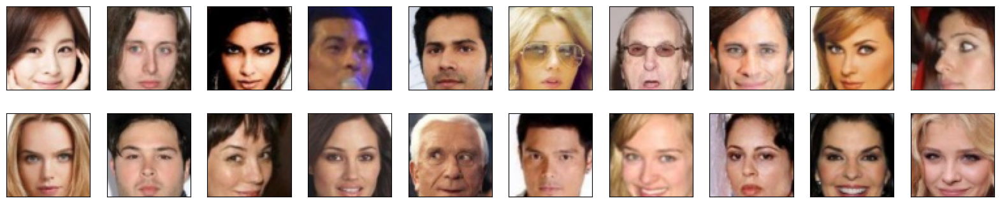

In [215]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [216]:
from torch.nn import Module
import torch.nn as nn 

In [217]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int,stride=2,padding=1, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        ####
        # IMPLEMENT HERE
        self.conv = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride= stride,padding=padding, bias=False)
        self.batch_norm = batch_norm
        self.batch_norm_layer = nn.BatchNorm2d(out_channels)
        self.le_relu= nn.LeakyReLU() 
        

        ####
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        x = self.conv(x)

        if self.batch_norm: 
            x = self.batch_norm_layer(x)

        x = self.le_relu(x)    


        ####
        return x

In [218]:
class Discriminator(Module):
    def __init__(self, conv_dim = 256, in_channels = 3):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.conv_dim = conv_dim
        self.conv_block1 = ConvBlock(in_channels=in_channels, out_channels= 64, kernel_size=4, batch_norm= False) # >>> (16,16,16)
        self.conv_block2 = ConvBlock(in_channels=64, out_channels= 128, kernel_size=4, batch_norm= True) # >>> (8,8,32)
        self.conv_block3 = ConvBlock(in_channels=128, out_channels= 256, kernel_size=4, batch_norm= True) # >>> (4,4,64)
        self.conv_block4 = ConvBlock(in_channels=256, out_channels= 512, kernel_size=4, batch_norm= True) # >>> (4,4,64)
        self.conv_block5 = ConvBlock(in_channels=512, out_channels= self.conv_dim, kernel_size=4,stride = 1, padding =0, batch_norm= False) # >>> (4,4,64)
        

        self.flatten = nn.Flatten()
        self.avg_pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc1 = nn.Linear(in_features=self.conv_dim, out_features=1)
        
        ####

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        # IMPLEMENT HERE
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        x = self.conv_block5(x)
        x = self.avg_pool(x)
        x = self.flatten(x)
        x =self.fc1(x)
        x = torch.reshape(x,(-1,1,1,1))
        
        ####      
        return x
    

In [219]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [220]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int = 1,
                 batch_norm: bool = True, 
                 last_conv: bool = False):
        ####
        # IMPLEMENT HERE
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels= in_channels, out_channels= out_channels, kernel_size= kernel_size, stride= stride,
                                         padding=padding, bias=False
                                         )
        self.batch_norm = batch_norm
        self.batch_norm_layer = nn.BatchNorm2d(out_channels)
        
        self.last_conv = last_conv
        if self.last_conv: 
            self.last_activation= nn.Tanh()
        else: 
            self.le_relu= nn.ReLU(True) 



        ####
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        x = self.deconv(x)

        if self.batch_norm: 
            x = self.batch_norm_layer(x)
        if self.last_conv: 
            x = self.last_activation(x)
        else: 

            x = self.le_relu(x)    


        
        ####
        return x

In [221]:
class Generator(Module):
    def __init__(self, latent_dim: int, conv_dim = 32):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        # IMPLEMENT HERE
        self.latent_dim= latent_dim
        self.conv_dim = 64
        self.deconv_block1 = DeconvBlock(in_channels=self.latent_dim, out_channels=256, kernel_size=4, stride=1, padding= 0 ) # Input is 1x1x32, output is 2x2x16
        self.deconv_block2 = DeconvBlock(in_channels=256, out_channels=128, kernel_size=4, stride=2) # Input is 1x1x32, output is 2x2x16
        self.deconv_block3 = DeconvBlock(in_channels=128, out_channels=64, kernel_size=4, stride=2) # Input is 1x1x32, output is 2x2x16
        self.deconv_block4 = DeconvBlock(in_channels=64, out_channels=16, kernel_size=4, stride=2) # Input is 8x8x16,l outputs is 16x16x8
        self.deconv_block5 = DeconvBlock(in_channels=16, out_channels=3, kernel_size=4, stride=2, last_conv=True) # Input is 16x16x8,l outputs is 32x32x3
        # self.deconv_block6 = DeconvBlock(in_channels=3, out_channels=3, kernel_size=4, stride=1, last_conv=True) # Input is 16x16x8,l outputs is 32x32x3
        self.last_activation= nn.Tanh()




        ####
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        # IMPLEMENT HERE
        x = torch.reshape(x,(-1, self.latent_dim, 1, 1)) #(batch, channels, height, width)
        x = self.deconv_block1(x)
        x = self.deconv_block2(x)
        x = self.deconv_block3(x)
        x = self.deconv_block4(x)
        x = self.deconv_block5(x)
        # x = self.deconv_block6(x)

        ####
        return x
    

In [222]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [223]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    # hyperparams for Adam optimizer
    lr=0.0002
    beta1=0.5
    beta2=0.999 # default value1
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [224]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    batch_size = fake_logits.size(0)
    labels = torch.ones(batch_size) # fake labels = 0
    
    labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(fake_logits.squeeze(), labels)

    # loss =  -torch.mean(fake_logits)
    return loss


### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [225]:
def discriminator_loss(real_logits, fake_logits,smooth=False):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 

    batch_size = real_logits.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        real_labels = torch.ones(batch_size)*0.9
    else:
        real_labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    real_labels = real_labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()

    # calculate loss
    real_loss = criterion(real_logits.squeeze(), real_labels)


    fake_labels = torch.zeros(batch_size).cuda()

    fake_loss = criterion(fake_logits.squeeze(), fake_labels)
    loss = [real_loss, fake_loss]

    # loss = -torch.mean(real_logits) + torch.mean(fake_logits)
    
    
    return loss
    


### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [226]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    # TODO (Optional): implement the gradient penalty
    gp = 0 # We are using the BCE loss for now so we will not use gradient penalty 

    # alpha = torch.rand(real_samples.shape).cuda()
    # x = alpha*real_samples+ (1-alpha)*fake_samples
    # # x.requires_grad = True

    
    
    # auto_grad = torch.autograd.grad(discriminator(x), x, grad_outputs=torch.ones_like(discriminator(x)), create_graph=True)[0]
    # L2_norm = torch.norm(auto_grad, 2)

    # gp = torch.mean((L2_norm.view(-1) - 1)**2)
    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [227]:
def generator_step(batch_size: int, latent_dim: int, generator: Module,discriminator: Module, g_optimizer) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    
    latent_batch = np.random.uniform(-1,1,size= (batch_size, latent_dim, 1, 1))
    latent_batch = torch.from_numpy(latent_batch).float().cuda()
    
    fake_images = generator(latent_batch)
    fake_logits = discriminator(fake_images)

    g_loss = generator_loss(fake_logits)
    g_loss.backward()
    g_optimizer.step()


    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor , discriminator: Module, d_optimizer) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    real_logits = discriminator(real_images)

    latent_batch = np.random.uniform(-1,1,size= (batch_size, latent_dim, 1, 1))
    latent_batch = torch.from_numpy(latent_batch).float().cuda()
    
    fake_images = generator(latent_batch)
    fake_logits = discriminator(fake_images)
    

    d_loss = discriminator_loss(real_logits, fake_logits,smooth=True)
    d_loss[0].backward()
    d_loss[1].backward()
    gp = gradient_penalty(discriminator, real_images, fake_images)
    d_loss = sum(d_loss) 
    # d_loss.backward()
    d_optimizer.step()

    

    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [228]:
from datetime import datetime

In [229]:
# you can experiment with different dimensions of latent spaces
latent_dim = 100

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 30

# number of images in each batch
batch_size = 64

In [230]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=1, 
                        drop_last=True,
                        pin_memory=False)

In [231]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-11-22 16:57:11 | Epoch [1/30] | Batch 0/509 | d_loss: 1.4028 | g_loss: 1.7880


2023-11-22 16:57:12 | Epoch [1/30] | Batch 50/509 | d_loss: 0.3292 | g_loss: 8.8206
2023-11-22 16:57:14 | Epoch [1/30] | Batch 100/509 | d_loss: 0.3294 | g_loss: 14.1413
2023-11-22 16:57:15 | Epoch [1/30] | Batch 150/509 | d_loss: 0.3287 | g_loss: 7.6624
2023-11-22 16:57:17 | Epoch [1/30] | Batch 200/509 | d_loss: 0.3573 | g_loss: 4.9046
2023-11-22 16:57:19 | Epoch [1/30] | Batch 250/509 | d_loss: 0.3884 | g_loss: 4.3417
2023-11-22 16:57:20 | Epoch [1/30] | Batch 300/509 | d_loss: 0.3376 | g_loss: 6.5443
2023-11-22 16:57:22 | Epoch [1/30] | Batch 350/509 | d_loss: 0.3371 | g_loss: 6.4350
2023-11-22 16:57:24 | Epoch [1/30] | Batch 400/509 | d_loss: 0.3290 | g_loss: 8.1770
2023-11-22 16:57:25 | Epoch [1/30] | Batch 450/509 | d_loss: 0.3374 | g_loss: 5.6027
2023-11-22 16:57:27 | Epoch [1/30] | Batch 500/509 | d_loss: 0.3591 | g_loss: 5.1814


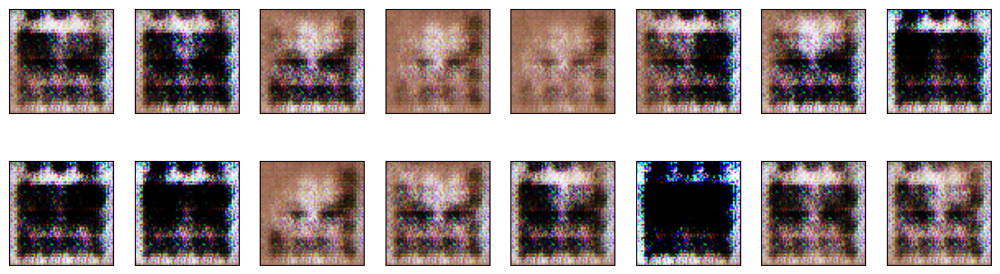

2023-11-22 16:57:28 | Epoch [2/30] | Batch 0/509 | d_loss: 0.3475 | g_loss: 5.0144
2023-11-22 16:57:30 | Epoch [2/30] | Batch 50/509 | d_loss: 0.3716 | g_loss: 6.4536
2023-11-22 16:57:31 | Epoch [2/30] | Batch 100/509 | d_loss: 0.3661 | g_loss: 5.2570
2023-11-22 16:57:33 | Epoch [2/30] | Batch 150/509 | d_loss: 0.3471 | g_loss: 5.2288
2023-11-22 16:57:35 | Epoch [2/30] | Batch 200/509 | d_loss: 0.4838 | g_loss: 2.3131
2023-11-22 16:57:37 | Epoch [2/30] | Batch 250/509 | d_loss: 0.4125 | g_loss: 5.2151
2023-11-22 16:57:38 | Epoch [2/30] | Batch 300/509 | d_loss: 2.2616 | g_loss: 4.6244
2023-11-22 16:57:40 | Epoch [2/30] | Batch 350/509 | d_loss: 0.3704 | g_loss: 4.8992
2023-11-22 16:57:42 | Epoch [2/30] | Batch 400/509 | d_loss: 0.5473 | g_loss: 9.4433
2023-11-22 16:57:43 | Epoch [2/30] | Batch 450/509 | d_loss: 0.3915 | g_loss: 5.3582
2023-11-22 16:57:45 | Epoch [2/30] | Batch 500/509 | d_loss: 0.4440 | g_loss: 5.2272


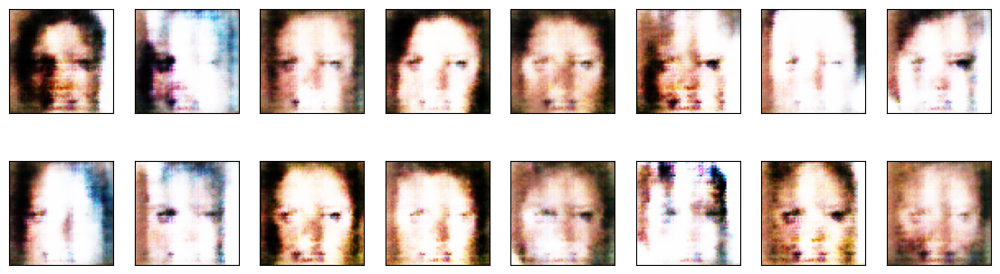

2023-11-22 16:57:46 | Epoch [3/30] | Batch 0/509 | d_loss: 0.5146 | g_loss: 5.2965
2023-11-22 16:57:47 | Epoch [3/30] | Batch 50/509 | d_loss: 0.4562 | g_loss: 2.8511
2023-11-22 16:57:49 | Epoch [3/30] | Batch 100/509 | d_loss: 0.5084 | g_loss: 10.1887
2023-11-22 16:57:51 | Epoch [3/30] | Batch 150/509 | d_loss: 0.3626 | g_loss: 2.4167
2023-11-22 16:57:52 | Epoch [3/30] | Batch 200/509 | d_loss: 1.2448 | g_loss: 10.0324
2023-11-22 16:57:54 | Epoch [3/30] | Batch 250/509 | d_loss: 0.4216 | g_loss: 5.4752
2023-11-22 16:57:56 | Epoch [3/30] | Batch 300/509 | d_loss: 0.5159 | g_loss: 4.2798
2023-11-22 16:57:58 | Epoch [3/30] | Batch 350/509 | d_loss: 0.5166 | g_loss: 5.9818
2023-11-22 16:57:59 | Epoch [3/30] | Batch 400/509 | d_loss: 0.4294 | g_loss: 5.8495
2023-11-22 16:58:01 | Epoch [3/30] | Batch 450/509 | d_loss: 0.4502 | g_loss: 6.7146
2023-11-22 16:58:03 | Epoch [3/30] | Batch 500/509 | d_loss: 0.4493 | g_loss: 4.0414


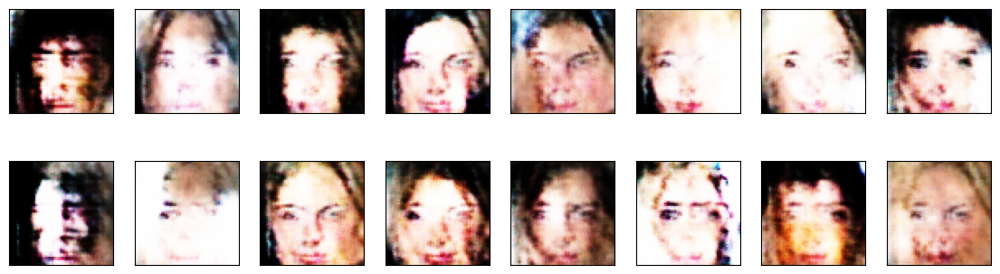

2023-11-22 16:58:03 | Epoch [4/30] | Batch 0/509 | d_loss: 0.3843 | g_loss: 4.1493
2023-11-22 16:58:05 | Epoch [4/30] | Batch 50/509 | d_loss: 0.4404 | g_loss: 4.2698
2023-11-22 16:58:07 | Epoch [4/30] | Batch 100/509 | d_loss: 0.5675 | g_loss: 7.6159
2023-11-22 16:58:08 | Epoch [4/30] | Batch 150/509 | d_loss: 0.4780 | g_loss: 4.7796
2023-11-22 16:58:10 | Epoch [4/30] | Batch 200/509 | d_loss: 0.4402 | g_loss: 5.9434
2023-11-22 16:58:12 | Epoch [4/30] | Batch 250/509 | d_loss: 0.4117 | g_loss: 4.8808
2023-11-22 16:58:13 | Epoch [4/30] | Batch 300/509 | d_loss: 0.4429 | g_loss: 3.6116
2023-11-22 16:58:15 | Epoch [4/30] | Batch 350/509 | d_loss: 0.4907 | g_loss: 4.0260
2023-11-22 16:58:17 | Epoch [4/30] | Batch 400/509 | d_loss: 0.3696 | g_loss: 5.7004
2023-11-22 16:58:18 | Epoch [4/30] | Batch 450/509 | d_loss: 0.5479 | g_loss: 4.1474
2023-11-22 16:58:20 | Epoch [4/30] | Batch 500/509 | d_loss: 0.4482 | g_loss: 5.7920


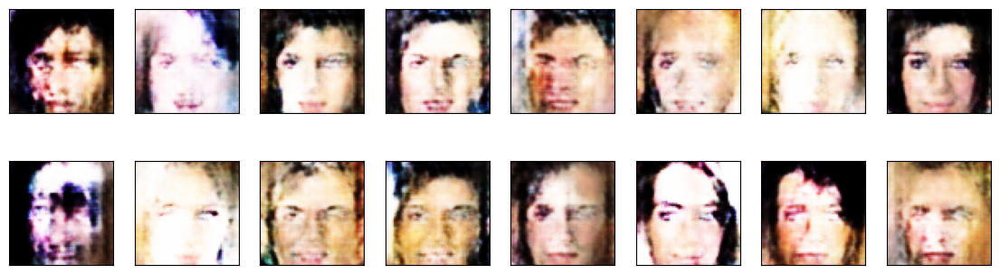

2023-11-22 16:58:21 | Epoch [5/30] | Batch 0/509 | d_loss: 0.4119 | g_loss: 5.8408
2023-11-22 16:58:22 | Epoch [5/30] | Batch 50/509 | d_loss: 0.4427 | g_loss: 5.3512
2023-11-22 16:58:24 | Epoch [5/30] | Batch 100/509 | d_loss: 0.3997 | g_loss: 4.9620
2023-11-22 16:58:25 | Epoch [5/30] | Batch 150/509 | d_loss: 0.4086 | g_loss: 3.9553
2023-11-22 16:58:27 | Epoch [5/30] | Batch 200/509 | d_loss: 0.4856 | g_loss: 3.1889
2023-11-22 16:58:29 | Epoch [5/30] | Batch 250/509 | d_loss: 0.4034 | g_loss: 4.7402
2023-11-22 16:58:30 | Epoch [5/30] | Batch 300/509 | d_loss: 1.0588 | g_loss: 14.1350
2023-11-22 16:58:32 | Epoch [5/30] | Batch 350/509 | d_loss: 0.4367 | g_loss: 5.1827
2023-11-22 16:58:34 | Epoch [5/30] | Batch 400/509 | d_loss: 0.4505 | g_loss: 6.9339
2023-11-22 16:58:35 | Epoch [5/30] | Batch 450/509 | d_loss: 0.3787 | g_loss: 5.1226
2023-11-22 16:58:37 | Epoch [5/30] | Batch 500/509 | d_loss: 0.4335 | g_loss: 6.6486


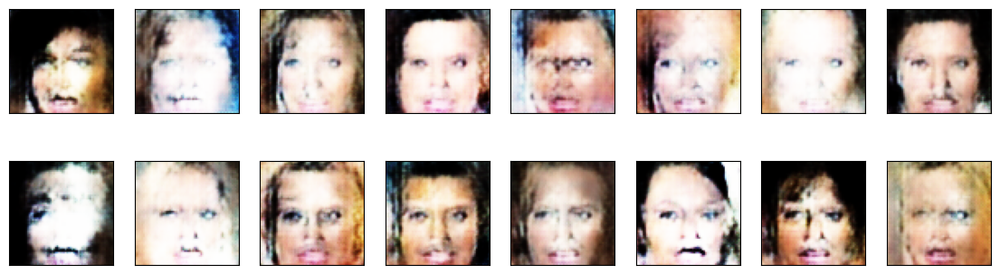

2023-11-22 16:58:38 | Epoch [6/30] | Batch 0/509 | d_loss: 0.3890 | g_loss: 4.7978
2023-11-22 16:58:39 | Epoch [6/30] | Batch 50/509 | d_loss: 0.3932 | g_loss: 4.8205
2023-11-22 16:58:41 | Epoch [6/30] | Batch 100/509 | d_loss: 0.4075 | g_loss: 5.3848
2023-11-22 16:58:43 | Epoch [6/30] | Batch 150/509 | d_loss: 0.4543 | g_loss: 6.5375
2023-11-22 16:58:45 | Epoch [6/30] | Batch 200/509 | d_loss: 0.3429 | g_loss: 7.0534
2023-11-22 16:58:46 | Epoch [6/30] | Batch 250/509 | d_loss: 0.4605 | g_loss: 5.7531
2023-11-22 16:58:48 | Epoch [6/30] | Batch 300/509 | d_loss: 0.4082 | g_loss: 4.5945
2023-11-22 16:58:50 | Epoch [6/30] | Batch 350/509 | d_loss: 0.4435 | g_loss: 3.7854
2023-11-22 16:58:51 | Epoch [6/30] | Batch 400/509 | d_loss: 0.5459 | g_loss: 8.3849
2023-11-22 16:58:53 | Epoch [6/30] | Batch 450/509 | d_loss: 0.3710 | g_loss: 5.6778
2023-11-22 16:58:55 | Epoch [6/30] | Batch 500/509 | d_loss: 0.3689 | g_loss: 6.7678


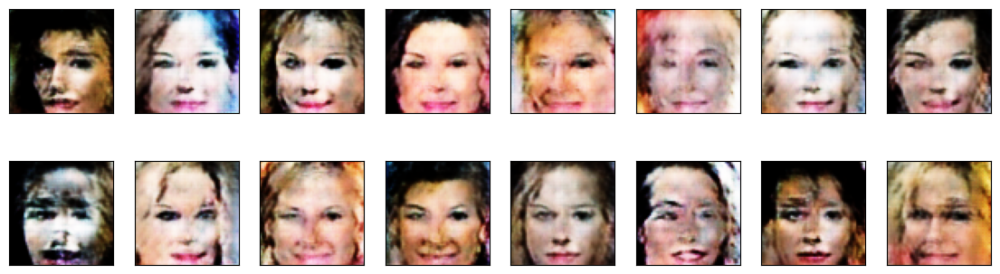

2023-11-22 16:58:55 | Epoch [7/30] | Batch 0/509 | d_loss: 0.4934 | g_loss: 3.9343
2023-11-22 16:58:57 | Epoch [7/30] | Batch 50/509 | d_loss: 0.3488 | g_loss: 8.2968
2023-11-22 16:58:59 | Epoch [7/30] | Batch 100/509 | d_loss: 0.4158 | g_loss: 5.1540
2023-11-22 16:59:00 | Epoch [7/30] | Batch 150/509 | d_loss: 0.4182 | g_loss: 4.0590
2023-11-22 16:59:02 | Epoch [7/30] | Batch 200/509 | d_loss: 0.4395 | g_loss: 5.5703
2023-11-22 16:59:04 | Epoch [7/30] | Batch 250/509 | d_loss: 0.3531 | g_loss: 6.7287
2023-11-22 16:59:05 | Epoch [7/30] | Batch 300/509 | d_loss: 0.3995 | g_loss: 8.1442
2023-11-22 16:59:07 | Epoch [7/30] | Batch 350/509 | d_loss: 0.4462 | g_loss: 6.0189
2023-11-22 16:59:09 | Epoch [7/30] | Batch 400/509 | d_loss: 0.3716 | g_loss: 6.2761
2023-11-22 16:59:10 | Epoch [7/30] | Batch 450/509 | d_loss: 0.5603 | g_loss: 10.0944
2023-11-22 16:59:12 | Epoch [7/30] | Batch 500/509 | d_loss: 0.7429 | g_loss: 7.3623


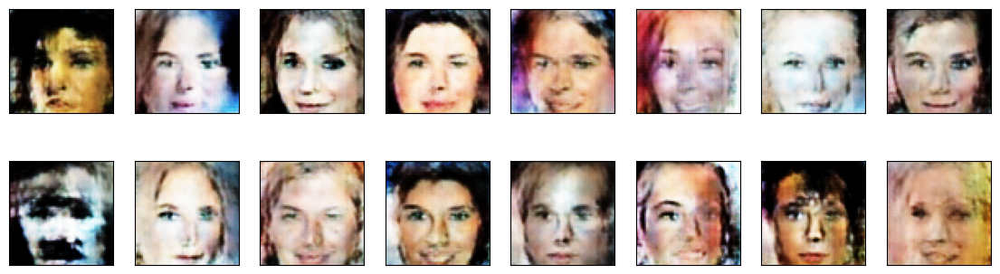

2023-11-22 16:59:12 | Epoch [8/30] | Batch 0/509 | d_loss: 0.5254 | g_loss: 5.7675
2023-11-22 16:59:14 | Epoch [8/30] | Batch 50/509 | d_loss: 0.3920 | g_loss: 4.1594
2023-11-22 16:59:16 | Epoch [8/30] | Batch 100/509 | d_loss: 0.3744 | g_loss: 4.4867
2023-11-22 16:59:17 | Epoch [8/30] | Batch 150/509 | d_loss: 0.3964 | g_loss: 5.6192
2023-11-22 16:59:19 | Epoch [8/30] | Batch 200/509 | d_loss: 0.5913 | g_loss: 4.1434
2023-11-22 16:59:21 | Epoch [8/30] | Batch 250/509 | d_loss: 0.4471 | g_loss: 4.8049
2023-11-22 16:59:22 | Epoch [8/30] | Batch 300/509 | d_loss: 0.3555 | g_loss: 4.5174
2023-11-22 16:59:24 | Epoch [8/30] | Batch 350/509 | d_loss: 0.4004 | g_loss: 5.1658
2023-11-22 16:59:26 | Epoch [8/30] | Batch 400/509 | d_loss: 0.3982 | g_loss: 5.1037
2023-11-22 16:59:27 | Epoch [8/30] | Batch 450/509 | d_loss: 0.5031 | g_loss: 6.9351
2023-11-22 16:59:29 | Epoch [8/30] | Batch 500/509 | d_loss: 0.4062 | g_loss: 5.1672


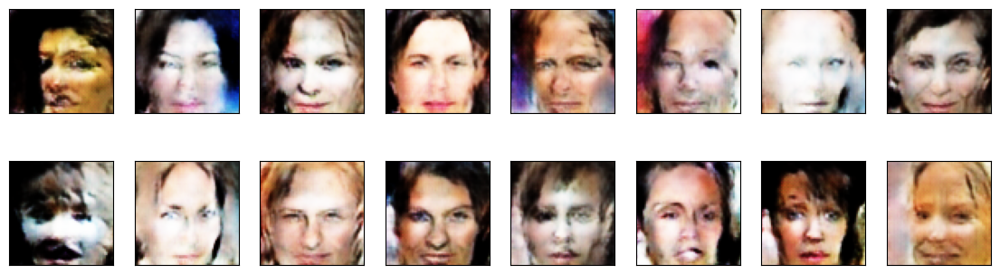

2023-11-22 16:59:30 | Epoch [9/30] | Batch 0/509 | d_loss: 0.3882 | g_loss: 5.1472
2023-11-22 16:59:31 | Epoch [9/30] | Batch 50/509 | d_loss: 0.9882 | g_loss: 5.2016
2023-11-22 16:59:33 | Epoch [9/30] | Batch 100/509 | d_loss: 0.4353 | g_loss: 5.4314
2023-11-22 16:59:35 | Epoch [9/30] | Batch 150/509 | d_loss: 0.6326 | g_loss: 1.7159
2023-11-22 16:59:36 | Epoch [9/30] | Batch 200/509 | d_loss: 0.3756 | g_loss: 4.5684
2023-11-22 16:59:38 | Epoch [9/30] | Batch 250/509 | d_loss: 0.3700 | g_loss: 5.9240
2023-11-22 16:59:40 | Epoch [9/30] | Batch 300/509 | d_loss: 0.3679 | g_loss: 8.6992
2023-11-22 16:59:41 | Epoch [9/30] | Batch 350/509 | d_loss: 0.4274 | g_loss: 6.1514
2023-11-22 16:59:43 | Epoch [9/30] | Batch 400/509 | d_loss: 0.4533 | g_loss: 2.2218
2023-11-22 16:59:45 | Epoch [9/30] | Batch 450/509 | d_loss: 0.5811 | g_loss: 6.0463
2023-11-22 16:59:46 | Epoch [9/30] | Batch 500/509 | d_loss: 0.4113 | g_loss: 6.9827


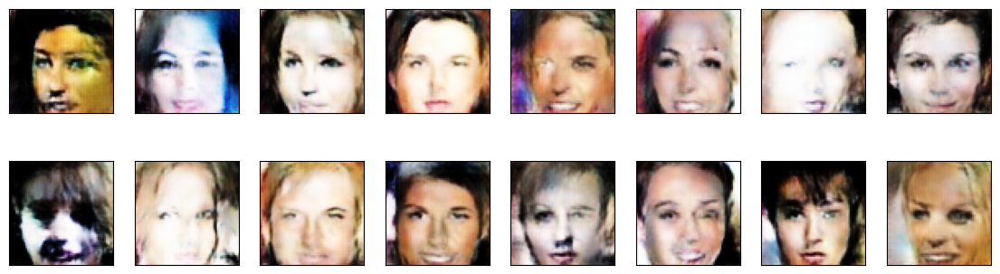

2023-11-22 16:59:47 | Epoch [10/30] | Batch 0/509 | d_loss: 0.4334 | g_loss: 4.4732
2023-11-22 16:59:49 | Epoch [10/30] | Batch 50/509 | d_loss: 0.4189 | g_loss: 5.4980
2023-11-22 16:59:50 | Epoch [10/30] | Batch 100/509 | d_loss: 1.2541 | g_loss: 14.9667
2023-11-22 16:59:52 | Epoch [10/30] | Batch 150/509 | d_loss: 0.3588 | g_loss: 5.5394
2023-11-22 16:59:54 | Epoch [10/30] | Batch 200/509 | d_loss: 0.3921 | g_loss: 5.8068
2023-11-22 16:59:55 | Epoch [10/30] | Batch 250/509 | d_loss: 0.3434 | g_loss: 6.3553
2023-11-22 16:59:57 | Epoch [10/30] | Batch 300/509 | d_loss: 0.4041 | g_loss: 6.9186
2023-11-22 16:59:59 | Epoch [10/30] | Batch 350/509 | d_loss: 0.4204 | g_loss: 12.3332
2023-11-22 17:00:00 | Epoch [10/30] | Batch 400/509 | d_loss: 0.3590 | g_loss: 4.2529
2023-11-22 17:00:02 | Epoch [10/30] | Batch 450/509 | d_loss: 0.3498 | g_loss: 8.1523
2023-11-22 17:00:04 | Epoch [10/30] | Batch 500/509 | d_loss: 0.4120 | g_loss: 5.6955


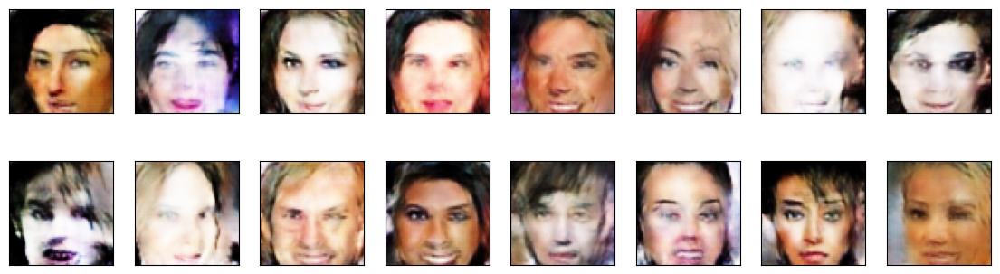

2023-11-22 17:00:04 | Epoch [11/30] | Batch 0/509 | d_loss: 0.4624 | g_loss: 5.7304
2023-11-22 17:00:06 | Epoch [11/30] | Batch 50/509 | d_loss: 0.5504 | g_loss: 8.0415
2023-11-22 17:00:08 | Epoch [11/30] | Batch 100/509 | d_loss: 0.4191 | g_loss: 4.5182
2023-11-22 17:00:09 | Epoch [11/30] | Batch 150/509 | d_loss: 0.3544 | g_loss: 4.4925
2023-11-22 17:00:11 | Epoch [11/30] | Batch 200/509 | d_loss: 0.4333 | g_loss: 5.7385
2023-11-22 17:00:13 | Epoch [11/30] | Batch 250/509 | d_loss: 0.7244 | g_loss: 4.6480
2023-11-22 17:00:14 | Epoch [11/30] | Batch 300/509 | d_loss: 2.2419 | g_loss: 3.4943
2023-11-22 17:00:16 | Epoch [11/30] | Batch 350/509 | d_loss: 0.3439 | g_loss: 4.8399
2023-11-22 17:00:18 | Epoch [11/30] | Batch 400/509 | d_loss: 2.3743 | g_loss: 0.9386
2023-11-22 17:00:20 | Epoch [11/30] | Batch 450/509 | d_loss: 0.3762 | g_loss: 9.7483
2023-11-22 17:00:21 | Epoch [11/30] | Batch 500/509 | d_loss: 0.4727 | g_loss: 2.8360


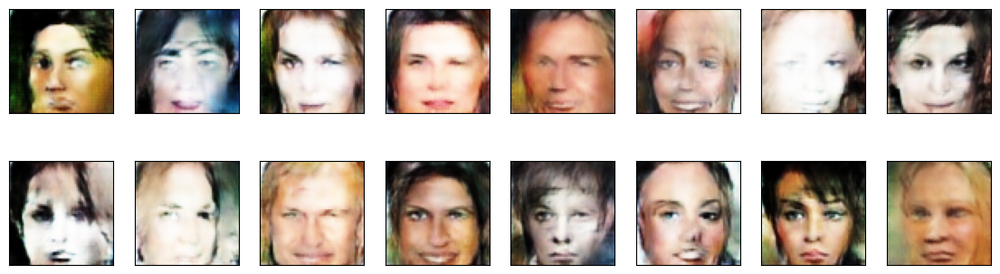

2023-11-22 17:00:22 | Epoch [12/30] | Batch 0/509 | d_loss: 0.3479 | g_loss: 5.2614
2023-11-22 17:00:24 | Epoch [12/30] | Batch 50/509 | d_loss: 0.3843 | g_loss: 6.2212
2023-11-22 17:00:25 | Epoch [12/30] | Batch 100/509 | d_loss: 2.1383 | g_loss: 0.2271
2023-11-22 17:00:27 | Epoch [12/30] | Batch 150/509 | d_loss: 0.7825 | g_loss: 1.6237
2023-11-22 17:00:29 | Epoch [12/30] | Batch 200/509 | d_loss: 0.4762 | g_loss: 6.3745
2023-11-22 17:00:30 | Epoch [12/30] | Batch 250/509 | d_loss: 0.3689 | g_loss: 4.6160
2023-11-22 17:00:32 | Epoch [12/30] | Batch 300/509 | d_loss: 0.4982 | g_loss: 5.2077
2023-11-22 17:00:34 | Epoch [12/30] | Batch 350/509 | d_loss: 0.3832 | g_loss: 3.4856
2023-11-22 17:00:35 | Epoch [12/30] | Batch 400/509 | d_loss: 0.5754 | g_loss: 6.5077
2023-11-22 17:00:37 | Epoch [12/30] | Batch 450/509 | d_loss: 0.5851 | g_loss: 5.2198
2023-11-22 17:00:39 | Epoch [12/30] | Batch 500/509 | d_loss: 0.4023 | g_loss: 6.4935


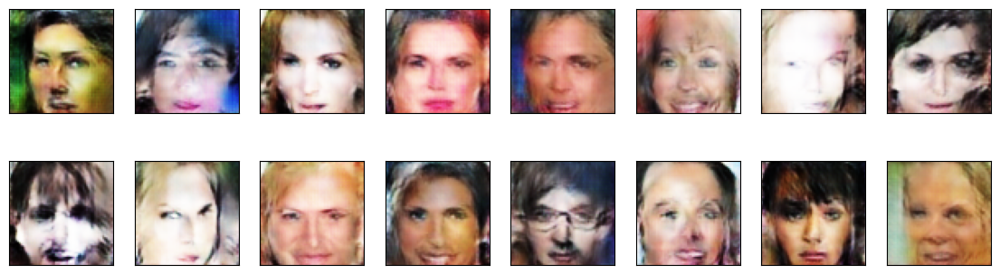

2023-11-22 17:00:39 | Epoch [13/30] | Batch 0/509 | d_loss: 0.4520 | g_loss: 7.6475
2023-11-22 17:00:41 | Epoch [13/30] | Batch 50/509 | d_loss: 0.3966 | g_loss: 7.0581
2023-11-22 17:00:43 | Epoch [13/30] | Batch 100/509 | d_loss: 0.3859 | g_loss: 7.9263
2023-11-22 17:00:44 | Epoch [13/30] | Batch 150/509 | d_loss: 0.5084 | g_loss: 5.3010
2023-11-22 17:00:46 | Epoch [13/30] | Batch 200/509 | d_loss: 0.3955 | g_loss: 7.6173
2023-11-22 17:00:48 | Epoch [13/30] | Batch 250/509 | d_loss: 0.3412 | g_loss: 6.1675
2023-11-22 17:00:49 | Epoch [13/30] | Batch 300/509 | d_loss: 0.6929 | g_loss: 8.9144
2023-11-22 17:00:51 | Epoch [13/30] | Batch 350/509 | d_loss: 0.3762 | g_loss: 9.3193
2023-11-22 17:00:52 | Epoch [13/30] | Batch 400/509 | d_loss: 0.4528 | g_loss: 9.9142
2023-11-22 17:00:54 | Epoch [13/30] | Batch 450/509 | d_loss: 0.3634 | g_loss: 4.9733
2023-11-22 17:00:56 | Epoch [13/30] | Batch 500/509 | d_loss: 0.5594 | g_loss: 5.9696


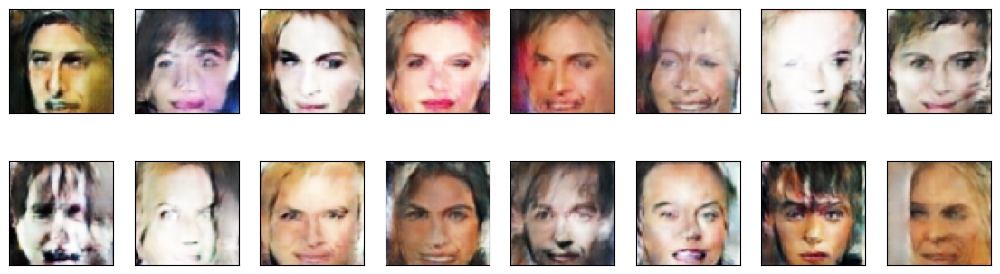

2023-11-22 17:00:56 | Epoch [14/30] | Batch 0/509 | d_loss: 0.5407 | g_loss: 2.1815
2023-11-22 17:00:58 | Epoch [14/30] | Batch 50/509 | d_loss: 0.3904 | g_loss: 6.5832
2023-11-22 17:01:00 | Epoch [14/30] | Batch 100/509 | d_loss: 0.4550 | g_loss: 5.3995
2023-11-22 17:01:01 | Epoch [14/30] | Batch 150/509 | d_loss: 0.3588 | g_loss: 6.7057
2023-11-22 17:01:03 | Epoch [14/30] | Batch 200/509 | d_loss: 0.3498 | g_loss: 6.9132
2023-11-22 17:01:05 | Epoch [14/30] | Batch 250/509 | d_loss: 0.3968 | g_loss: 6.5652
2023-11-22 17:01:07 | Epoch [14/30] | Batch 300/509 | d_loss: 0.4291 | g_loss: 9.0060
2023-11-22 17:01:08 | Epoch [14/30] | Batch 350/509 | d_loss: 0.4027 | g_loss: 7.6566
2023-11-22 17:01:10 | Epoch [14/30] | Batch 400/509 | d_loss: 0.3509 | g_loss: 7.6512
2023-11-22 17:01:12 | Epoch [14/30] | Batch 450/509 | d_loss: 0.4047 | g_loss: 5.6800
2023-11-22 17:01:13 | Epoch [14/30] | Batch 500/509 | d_loss: 0.5041 | g_loss: 6.5280


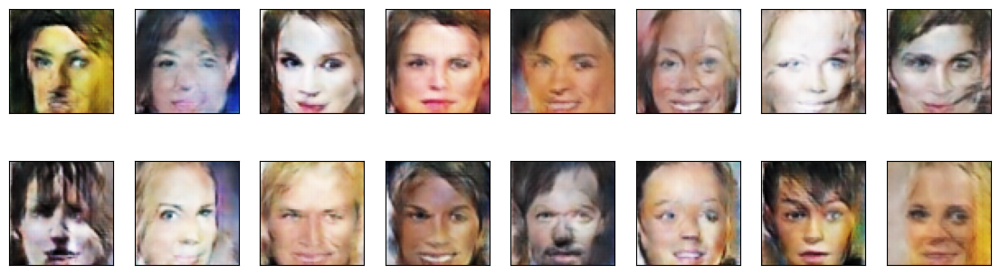

2023-11-22 17:01:14 | Epoch [15/30] | Batch 0/509 | d_loss: 0.3446 | g_loss: 8.3495
2023-11-22 17:01:16 | Epoch [15/30] | Batch 50/509 | d_loss: 0.3612 | g_loss: 9.9970
2023-11-22 17:01:17 | Epoch [15/30] | Batch 100/509 | d_loss: 0.3515 | g_loss: 6.8507
2023-11-22 17:01:19 | Epoch [15/30] | Batch 150/509 | d_loss: 0.6432 | g_loss: 6.8742
2023-11-22 17:01:21 | Epoch [15/30] | Batch 200/509 | d_loss: 0.4014 | g_loss: 5.5213
2023-11-22 17:01:22 | Epoch [15/30] | Batch 250/509 | d_loss: 0.3845 | g_loss: 9.5717
2023-11-22 17:01:24 | Epoch [15/30] | Batch 300/509 | d_loss: 0.4365 | g_loss: 8.7735
2023-11-22 17:01:26 | Epoch [15/30] | Batch 350/509 | d_loss: 0.4006 | g_loss: 5.5403
2023-11-22 17:01:27 | Epoch [15/30] | Batch 400/509 | d_loss: 0.5124 | g_loss: 13.1732
2023-11-22 17:01:29 | Epoch [15/30] | Batch 450/509 | d_loss: 0.7147 | g_loss: 2.5914
2023-11-22 17:01:31 | Epoch [15/30] | Batch 500/509 | d_loss: 0.3421 | g_loss: 7.7416


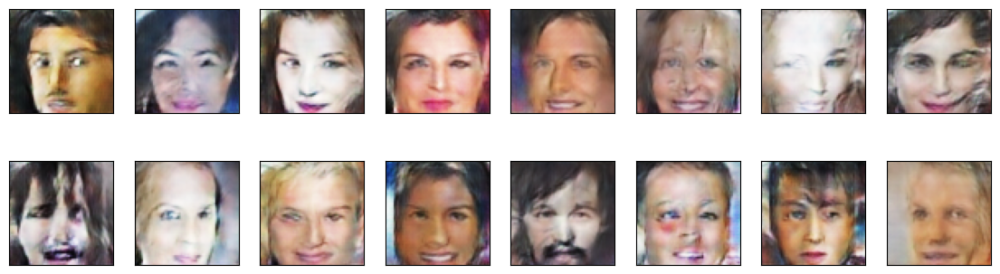

2023-11-22 17:01:31 | Epoch [16/30] | Batch 0/509 | d_loss: 1.7440 | g_loss: 4.5973
2023-11-22 17:01:33 | Epoch [16/30] | Batch 50/509 | d_loss: 0.3608 | g_loss: 7.6836
2023-11-22 17:01:35 | Epoch [16/30] | Batch 100/509 | d_loss: 0.3517 | g_loss: 7.6979
2023-11-22 17:01:36 | Epoch [16/30] | Batch 150/509 | d_loss: 0.3504 | g_loss: 7.4574
2023-11-22 17:01:38 | Epoch [16/30] | Batch 200/509 | d_loss: 0.3670 | g_loss: 6.5002
2023-11-22 17:01:39 | Epoch [16/30] | Batch 250/509 | d_loss: 0.4005 | g_loss: 5.9378
2023-11-22 17:01:41 | Epoch [16/30] | Batch 300/509 | d_loss: 0.4446 | g_loss: 3.7016
2023-11-22 17:01:43 | Epoch [16/30] | Batch 350/509 | d_loss: 0.3465 | g_loss: 7.2879
2023-11-22 17:01:44 | Epoch [16/30] | Batch 400/509 | d_loss: 0.3928 | g_loss: 4.7443
2023-11-22 17:01:46 | Epoch [16/30] | Batch 450/509 | d_loss: 0.8686 | g_loss: 11.0608
2023-11-22 17:01:48 | Epoch [16/30] | Batch 500/509 | d_loss: 0.5824 | g_loss: 12.9285


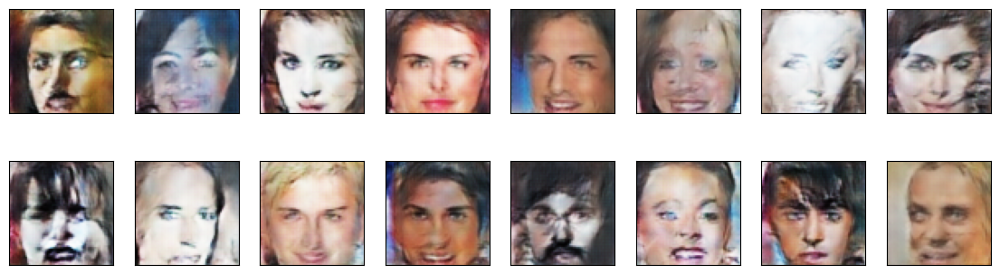

2023-11-22 17:01:49 | Epoch [17/30] | Batch 0/509 | d_loss: 0.5609 | g_loss: 4.7803
2023-11-22 17:01:50 | Epoch [17/30] | Batch 50/509 | d_loss: 0.3902 | g_loss: 6.5451
2023-11-22 17:01:52 | Epoch [17/30] | Batch 100/509 | d_loss: 0.3524 | g_loss: 5.7452
2023-11-22 17:01:54 | Epoch [17/30] | Batch 150/509 | d_loss: 0.7282 | g_loss: 0.8008
2023-11-22 17:01:55 | Epoch [17/30] | Batch 200/509 | d_loss: 0.3567 | g_loss: 4.2718
2023-11-22 17:01:57 | Epoch [17/30] | Batch 250/509 | d_loss: 0.3464 | g_loss: 7.6480
2023-11-22 17:01:59 | Epoch [17/30] | Batch 300/509 | d_loss: 0.3989 | g_loss: 5.2631
2023-11-22 17:02:01 | Epoch [17/30] | Batch 350/509 | d_loss: 0.3464 | g_loss: 9.1856
2023-11-22 17:02:02 | Epoch [17/30] | Batch 400/509 | d_loss: 0.3806 | g_loss: 6.5862
2023-11-22 17:02:04 | Epoch [17/30] | Batch 450/509 | d_loss: 0.3621 | g_loss: 7.0176
2023-11-22 17:02:06 | Epoch [17/30] | Batch 500/509 | d_loss: 0.4187 | g_loss: 7.2503


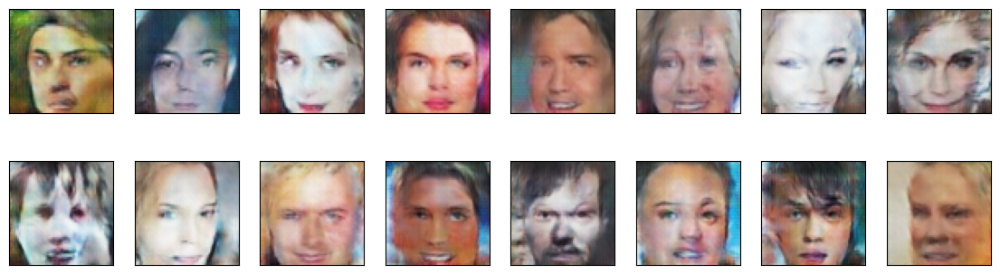

2023-11-22 17:02:06 | Epoch [18/30] | Batch 0/509 | d_loss: 0.5136 | g_loss: 6.7256
2023-11-22 17:02:08 | Epoch [18/30] | Batch 50/509 | d_loss: 0.4378 | g_loss: 4.3866
2023-11-22 17:02:10 | Epoch [18/30] | Batch 100/509 | d_loss: 0.3727 | g_loss: 8.0083
2023-11-22 17:02:11 | Epoch [18/30] | Batch 150/509 | d_loss: 0.3540 | g_loss: 6.2639
2023-11-22 17:02:13 | Epoch [18/30] | Batch 200/509 | d_loss: 0.3642 | g_loss: 4.4841
2023-11-22 17:02:15 | Epoch [18/30] | Batch 250/509 | d_loss: 1.1748 | g_loss: 14.0534
2023-11-22 17:02:16 | Epoch [18/30] | Batch 300/509 | d_loss: 0.4082 | g_loss: 8.3323
2023-11-22 17:02:18 | Epoch [18/30] | Batch 350/509 | d_loss: 0.4072 | g_loss: 8.3243
2023-11-22 17:02:20 | Epoch [18/30] | Batch 400/509 | d_loss: 0.4078 | g_loss: 5.5194
2023-11-22 17:02:21 | Epoch [18/30] | Batch 450/509 | d_loss: 0.3378 | g_loss: 7.2892
2023-11-22 17:02:23 | Epoch [18/30] | Batch 500/509 | d_loss: 0.6351 | g_loss: 5.3695


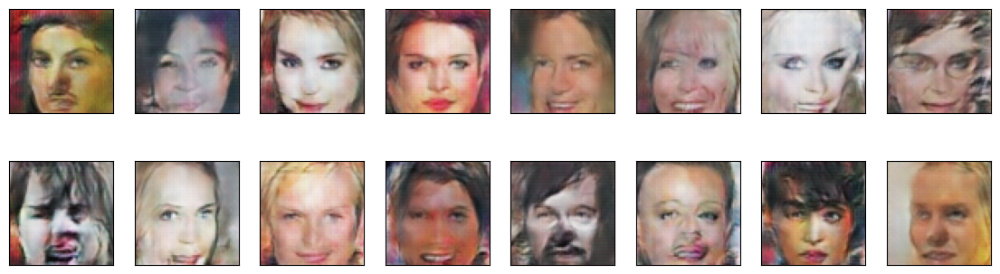

2023-11-22 17:02:24 | Epoch [19/30] | Batch 0/509 | d_loss: 0.7876 | g_loss: 8.0309
2023-11-22 17:02:25 | Epoch [19/30] | Batch 50/509 | d_loss: 0.4370 | g_loss: 6.3646
2023-11-22 17:02:27 | Epoch [19/30] | Batch 100/509 | d_loss: 0.3398 | g_loss: 8.9607
2023-11-22 17:02:29 | Epoch [19/30] | Batch 150/509 | d_loss: 0.3972 | g_loss: 5.5108
2023-11-22 17:02:30 | Epoch [19/30] | Batch 200/509 | d_loss: 0.3480 | g_loss: 7.4020
2023-11-22 17:02:32 | Epoch [19/30] | Batch 250/509 | d_loss: 0.6711 | g_loss: 3.0578
2023-11-22 17:02:34 | Epoch [19/30] | Batch 300/509 | d_loss: 0.4101 | g_loss: 7.2913
2023-11-22 17:02:35 | Epoch [19/30] | Batch 350/509 | d_loss: 0.4437 | g_loss: 10.2372
2023-11-22 17:02:37 | Epoch [19/30] | Batch 400/509 | d_loss: 0.3444 | g_loss: 8.7512
2023-11-22 17:02:39 | Epoch [19/30] | Batch 450/509 | d_loss: 0.3617 | g_loss: 5.6440
2023-11-22 17:02:40 | Epoch [19/30] | Batch 500/509 | d_loss: 0.4693 | g_loss: 8.5694


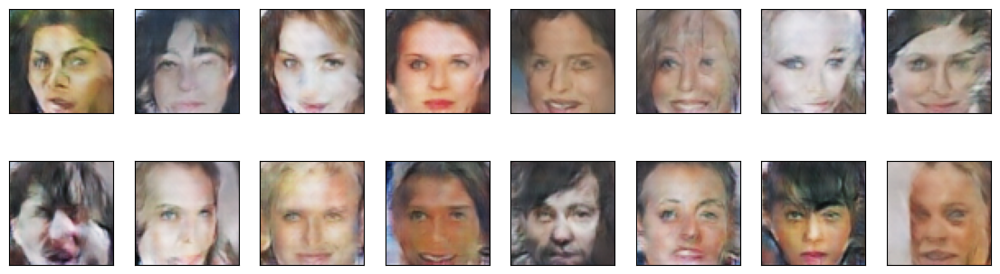

2023-11-22 17:02:41 | Epoch [20/30] | Batch 0/509 | d_loss: 0.3490 | g_loss: 6.5256
2023-11-22 17:02:43 | Epoch [20/30] | Batch 50/509 | d_loss: 0.8245 | g_loss: 4.5846
2023-11-22 17:02:44 | Epoch [20/30] | Batch 100/509 | d_loss: 0.4361 | g_loss: 5.3373
2023-11-22 17:02:46 | Epoch [20/30] | Batch 150/509 | d_loss: 0.4622 | g_loss: 3.6912
2023-11-22 17:02:48 | Epoch [20/30] | Batch 200/509 | d_loss: 0.3695 | g_loss: 6.2373
2023-11-22 17:02:49 | Epoch [20/30] | Batch 250/509 | d_loss: 0.5755 | g_loss: 6.0052
2023-11-22 17:02:51 | Epoch [20/30] | Batch 300/509 | d_loss: 0.3550 | g_loss: 6.4660
2023-11-22 17:02:53 | Epoch [20/30] | Batch 350/509 | d_loss: 0.3478 | g_loss: 6.2138
2023-11-22 17:02:54 | Epoch [20/30] | Batch 400/509 | d_loss: 0.3801 | g_loss: 5.7511
2023-11-22 17:02:56 | Epoch [20/30] | Batch 450/509 | d_loss: 0.4323 | g_loss: 4.9961
2023-11-22 17:02:57 | Epoch [20/30] | Batch 500/509 | d_loss: 0.3698 | g_loss: 6.3267


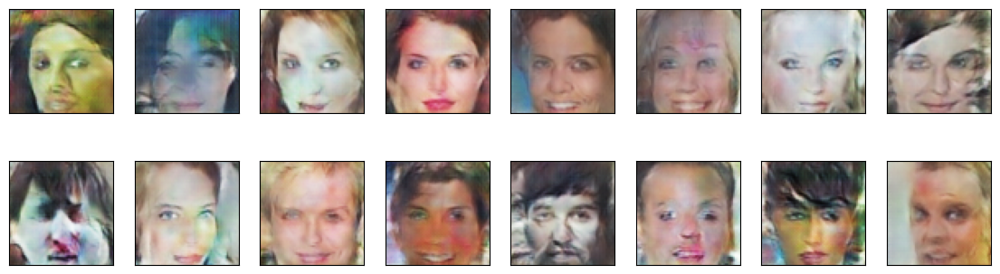

2023-11-22 17:02:58 | Epoch [21/30] | Batch 0/509 | d_loss: 0.3532 | g_loss: 6.1537
2023-11-22 17:03:00 | Epoch [21/30] | Batch 50/509 | d_loss: 0.3575 | g_loss: 6.3596
2023-11-22 17:03:02 | Epoch [21/30] | Batch 100/509 | d_loss: 0.3741 | g_loss: 6.9467
2023-11-22 17:03:03 | Epoch [21/30] | Batch 150/509 | d_loss: 0.3729 | g_loss: 5.3735
2023-11-22 17:03:05 | Epoch [21/30] | Batch 200/509 | d_loss: 0.3685 | g_loss: 6.7233
2023-11-22 17:03:07 | Epoch [21/30] | Batch 250/509 | d_loss: 0.5303 | g_loss: 2.8733
2023-11-22 17:03:09 | Epoch [21/30] | Batch 300/509 | d_loss: 0.6935 | g_loss: 1.2670
2023-11-22 17:03:10 | Epoch [21/30] | Batch 350/509 | d_loss: 0.4884 | g_loss: 9.7492
2023-11-22 17:03:12 | Epoch [21/30] | Batch 400/509 | d_loss: 0.3599 | g_loss: 7.2274
2023-11-22 17:03:14 | Epoch [21/30] | Batch 450/509 | d_loss: 0.3835 | g_loss: 8.6907
2023-11-22 17:03:15 | Epoch [21/30] | Batch 500/509 | d_loss: 0.4543 | g_loss: 8.4011


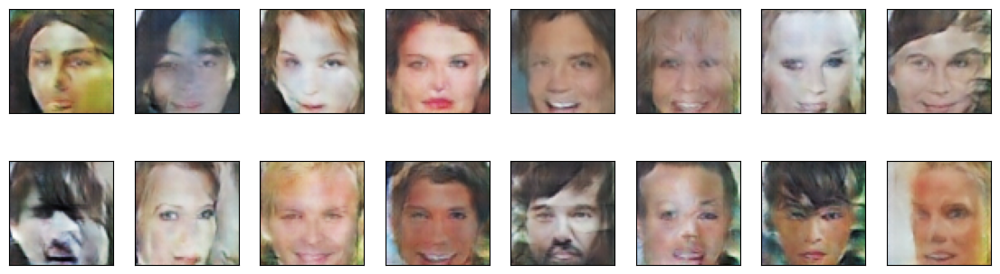

2023-11-22 17:03:16 | Epoch [22/30] | Batch 0/509 | d_loss: 0.3937 | g_loss: 6.3901
2023-11-22 17:03:18 | Epoch [22/30] | Batch 50/509 | d_loss: 0.3426 | g_loss: 7.8844
2023-11-22 17:03:20 | Epoch [22/30] | Batch 100/509 | d_loss: 0.3370 | g_loss: 9.0209
2023-11-22 17:03:21 | Epoch [22/30] | Batch 150/509 | d_loss: 0.3356 | g_loss: 7.4562
2023-11-22 17:03:23 | Epoch [22/30] | Batch 200/509 | d_loss: 0.3893 | g_loss: 5.2426
2023-11-22 17:03:25 | Epoch [22/30] | Batch 250/509 | d_loss: 0.4266 | g_loss: 4.2883
2023-11-22 17:03:26 | Epoch [22/30] | Batch 300/509 | d_loss: 0.3477 | g_loss: 6.5084
2023-11-22 17:03:28 | Epoch [22/30] | Batch 350/509 | d_loss: 0.9073 | g_loss: 5.3860
2023-11-22 17:03:30 | Epoch [22/30] | Batch 400/509 | d_loss: 0.3678 | g_loss: 6.6759
2023-11-22 17:03:32 | Epoch [22/30] | Batch 450/509 | d_loss: 0.3415 | g_loss: 8.3891
2023-11-22 17:03:33 | Epoch [22/30] | Batch 500/509 | d_loss: 0.3550 | g_loss: 8.8849


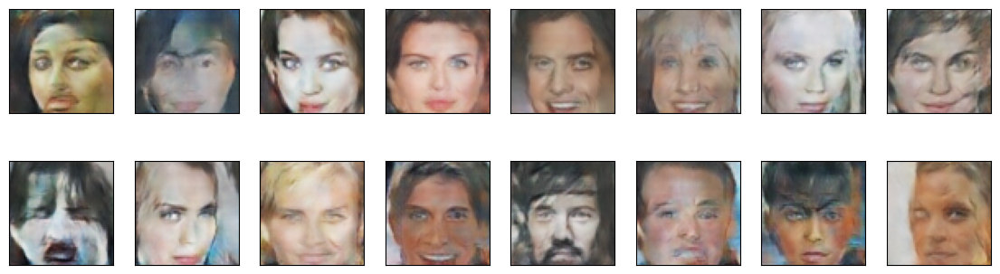

2023-11-22 17:03:34 | Epoch [23/30] | Batch 0/509 | d_loss: 0.4038 | g_loss: 5.0205
2023-11-22 17:03:36 | Epoch [23/30] | Batch 50/509 | d_loss: 0.3420 | g_loss: 8.0652
2023-11-22 17:03:37 | Epoch [23/30] | Batch 100/509 | d_loss: 0.3531 | g_loss: 6.2913
2023-11-22 17:03:39 | Epoch [23/30] | Batch 150/509 | d_loss: 0.4076 | g_loss: 6.9330
2023-11-22 17:03:41 | Epoch [23/30] | Batch 200/509 | d_loss: 0.3948 | g_loss: 6.2905
2023-11-22 17:03:42 | Epoch [23/30] | Batch 250/509 | d_loss: 0.3531 | g_loss: 7.2008
2023-11-22 17:03:44 | Epoch [23/30] | Batch 300/509 | d_loss: 0.3353 | g_loss: 9.0954
2023-11-22 17:03:46 | Epoch [23/30] | Batch 350/509 | d_loss: 0.3909 | g_loss: 6.3773
2023-11-22 17:03:47 | Epoch [23/30] | Batch 400/509 | d_loss: 0.4615 | g_loss: 6.6202
2023-11-22 17:03:49 | Epoch [23/30] | Batch 450/509 | d_loss: 0.3503 | g_loss: 6.2630
2023-11-22 17:03:51 | Epoch [23/30] | Batch 500/509 | d_loss: 0.3364 | g_loss: 7.3124


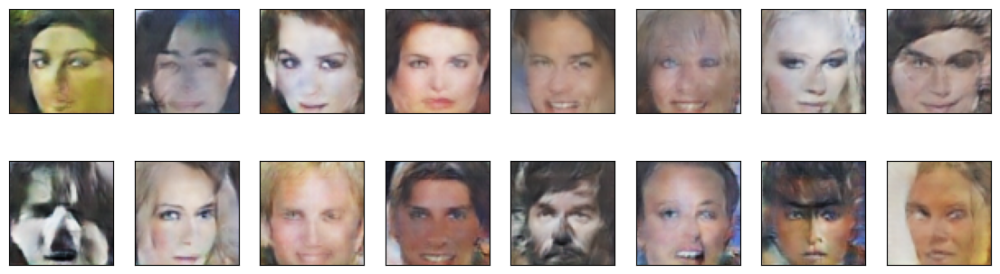

2023-11-22 17:03:51 | Epoch [24/30] | Batch 0/509 | d_loss: 0.4148 | g_loss: 6.4029
2023-11-22 17:03:53 | Epoch [24/30] | Batch 50/509 | d_loss: 0.3290 | g_loss: 17.4427
2023-11-22 17:03:54 | Epoch [24/30] | Batch 100/509 | d_loss: 0.3490 | g_loss: 5.5933
2023-11-22 17:03:56 | Epoch [24/30] | Batch 150/509 | d_loss: 0.3911 | g_loss: 5.5397
2023-11-22 17:03:58 | Epoch [24/30] | Batch 200/509 | d_loss: 0.3416 | g_loss: 9.8916
2023-11-22 17:04:00 | Epoch [24/30] | Batch 250/509 | d_loss: 0.5467 | g_loss: 9.5333
2023-11-22 17:04:01 | Epoch [24/30] | Batch 300/509 | d_loss: 0.5161 | g_loss: 3.4729
2023-11-22 17:04:03 | Epoch [24/30] | Batch 350/509 | d_loss: 0.3590 | g_loss: 4.4325
2023-11-22 17:04:05 | Epoch [24/30] | Batch 400/509 | d_loss: 0.4085 | g_loss: 5.8009
2023-11-22 17:04:06 | Epoch [24/30] | Batch 450/509 | d_loss: 0.6194 | g_loss: 3.9923
2023-11-22 17:04:08 | Epoch [24/30] | Batch 500/509 | d_loss: 0.3494 | g_loss: 8.0866


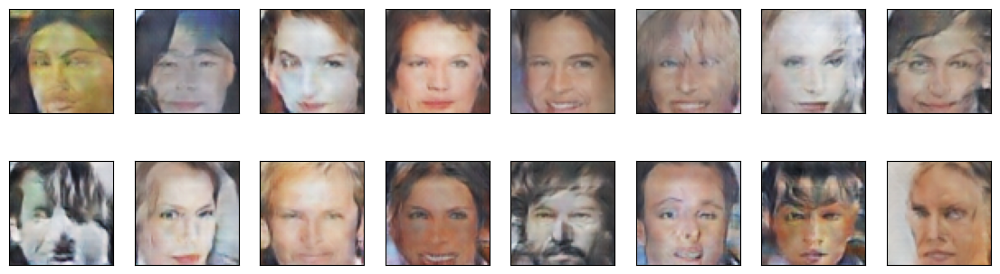

2023-11-22 17:04:09 | Epoch [25/30] | Batch 0/509 | d_loss: 0.3398 | g_loss: 8.0741
2023-11-22 17:04:10 | Epoch [25/30] | Batch 50/509 | d_loss: 0.3767 | g_loss: 7.8385
2023-11-22 17:04:12 | Epoch [25/30] | Batch 100/509 | d_loss: 0.3443 | g_loss: 6.8356
2023-11-22 17:04:14 | Epoch [25/30] | Batch 150/509 | d_loss: 0.4064 | g_loss: 5.0805
2023-11-22 17:04:15 | Epoch [25/30] | Batch 200/509 | d_loss: 0.3449 | g_loss: 8.9252
2023-11-22 17:04:17 | Epoch [25/30] | Batch 250/509 | d_loss: 0.3473 | g_loss: 8.0465
2023-11-22 17:04:19 | Epoch [25/30] | Batch 300/509 | d_loss: 0.3484 | g_loss: 7.2352
2023-11-22 17:04:20 | Epoch [25/30] | Batch 350/509 | d_loss: 1.0485 | g_loss: 2.6706
2023-11-22 17:04:22 | Epoch [25/30] | Batch 400/509 | d_loss: 0.3604 | g_loss: 7.3940
2023-11-22 17:04:24 | Epoch [25/30] | Batch 450/509 | d_loss: 0.5562 | g_loss: 11.3327
2023-11-22 17:04:25 | Epoch [25/30] | Batch 500/509 | d_loss: 0.4697 | g_loss: 7.8778


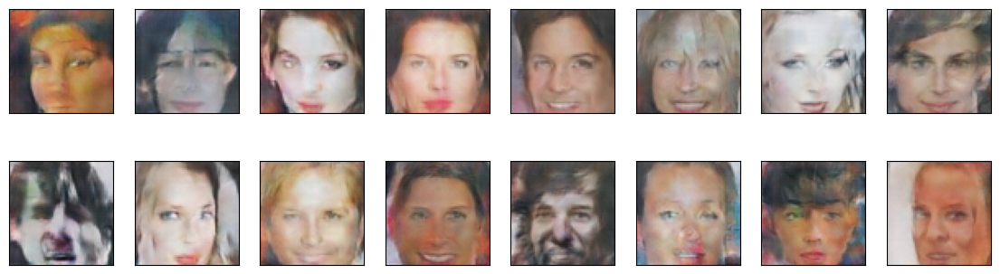

2023-11-22 17:04:26 | Epoch [26/30] | Batch 0/509 | d_loss: 0.3307 | g_loss: 13.0925
2023-11-22 17:04:28 | Epoch [26/30] | Batch 50/509 | d_loss: 0.3456 | g_loss: 5.7008
2023-11-22 17:04:29 | Epoch [26/30] | Batch 100/509 | d_loss: 0.8919 | g_loss: 3.0890
2023-11-22 17:04:31 | Epoch [26/30] | Batch 150/509 | d_loss: 0.5137 | g_loss: 3.8572
2023-11-22 17:04:33 | Epoch [26/30] | Batch 200/509 | d_loss: 0.8618 | g_loss: 3.8227
2023-11-22 17:04:34 | Epoch [26/30] | Batch 250/509 | d_loss: 0.5014 | g_loss: 8.8700
2023-11-22 17:04:36 | Epoch [26/30] | Batch 300/509 | d_loss: 0.3450 | g_loss: 5.8690
2023-11-22 17:04:38 | Epoch [26/30] | Batch 350/509 | d_loss: 0.3589 | g_loss: 6.8130
2023-11-22 17:04:39 | Epoch [26/30] | Batch 400/509 | d_loss: 0.3384 | g_loss: 8.4847
2023-11-22 17:04:41 | Epoch [26/30] | Batch 450/509 | d_loss: 0.3336 | g_loss: 9.8932
2023-11-22 17:04:43 | Epoch [26/30] | Batch 500/509 | d_loss: 0.4260 | g_loss: 5.8074


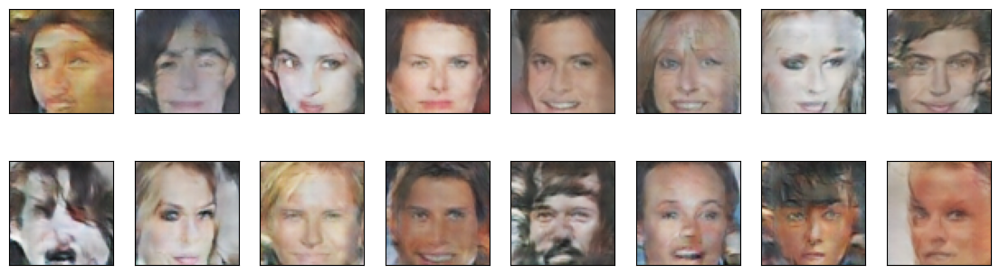

2023-11-22 17:04:43 | Epoch [27/30] | Batch 0/509 | d_loss: 0.3858 | g_loss: 6.8048
2023-11-22 17:04:45 | Epoch [27/30] | Batch 50/509 | d_loss: 0.4436 | g_loss: 2.9242
2023-11-22 17:04:47 | Epoch [27/30] | Batch 100/509 | d_loss: 0.3303 | g_loss: 7.9983
2023-11-22 17:04:48 | Epoch [27/30] | Batch 150/509 | d_loss: 0.3826 | g_loss: 9.0321
2023-11-22 17:04:50 | Epoch [27/30] | Batch 200/509 | d_loss: 0.3479 | g_loss: 6.7310
2023-11-22 17:04:52 | Epoch [27/30] | Batch 250/509 | d_loss: 0.5472 | g_loss: 9.9602
2023-11-22 17:04:53 | Epoch [27/30] | Batch 300/509 | d_loss: 0.3634 | g_loss: 6.9548
2023-11-22 17:04:55 | Epoch [27/30] | Batch 350/509 | d_loss: 0.3408 | g_loss: 9.5416
2023-11-22 17:04:57 | Epoch [27/30] | Batch 400/509 | d_loss: 0.5339 | g_loss: 6.1526
2023-11-22 17:04:58 | Epoch [27/30] | Batch 450/509 | d_loss: 0.3483 | g_loss: 7.7718
2023-11-22 17:05:00 | Epoch [27/30] | Batch 500/509 | d_loss: 0.4975 | g_loss: 4.8056


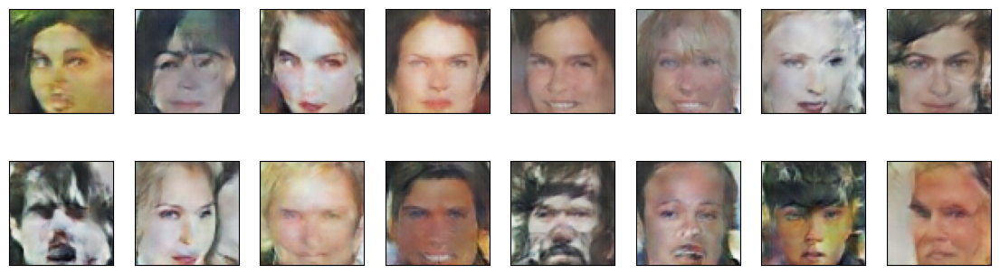

2023-11-22 17:05:01 | Epoch [28/30] | Batch 0/509 | d_loss: 0.3388 | g_loss: 6.5458
2023-11-22 17:05:02 | Epoch [28/30] | Batch 50/509 | d_loss: 0.4858 | g_loss: 6.6857
2023-11-22 17:05:04 | Epoch [28/30] | Batch 100/509 | d_loss: 0.3659 | g_loss: 6.8717
2023-11-22 17:05:06 | Epoch [28/30] | Batch 150/509 | d_loss: 0.3600 | g_loss: 7.5963
2023-11-22 17:05:07 | Epoch [28/30] | Batch 200/509 | d_loss: 0.3330 | g_loss: 6.4976
2023-11-22 17:05:09 | Epoch [28/30] | Batch 250/509 | d_loss: 0.3770 | g_loss: 6.4745
2023-11-22 17:05:11 | Epoch [28/30] | Batch 300/509 | d_loss: 0.3677 | g_loss: 6.6750
2023-11-22 17:05:12 | Epoch [28/30] | Batch 350/509 | d_loss: 0.3786 | g_loss: 4.7165
2023-11-22 17:05:14 | Epoch [28/30] | Batch 400/509 | d_loss: 0.4096 | g_loss: 3.2757
2023-11-22 17:05:15 | Epoch [28/30] | Batch 450/509 | d_loss: 0.4052 | g_loss: 4.4341
2023-11-22 17:05:17 | Epoch [28/30] | Batch 500/509 | d_loss: 0.3746 | g_loss: 5.2412


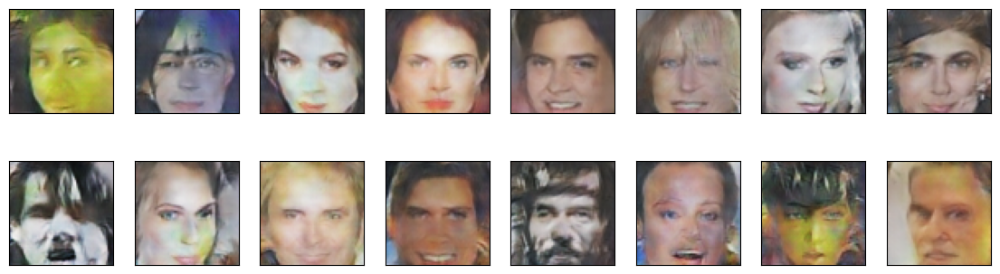

2023-11-22 17:05:18 | Epoch [29/30] | Batch 0/509 | d_loss: 0.3535 | g_loss: 5.5020
2023-11-22 17:05:20 | Epoch [29/30] | Batch 50/509 | d_loss: 0.3448 | g_loss: 7.7418
2023-11-22 17:05:21 | Epoch [29/30] | Batch 100/509 | d_loss: 0.3584 | g_loss: 5.6194
2023-11-22 17:05:23 | Epoch [29/30] | Batch 150/509 | d_loss: 0.3828 | g_loss: 6.3474
2023-11-22 17:05:25 | Epoch [29/30] | Batch 200/509 | d_loss: 0.3559 | g_loss: 4.6897
2023-11-22 17:05:26 | Epoch [29/30] | Batch 250/509 | d_loss: 0.4597 | g_loss: 4.9495
2023-11-22 17:05:28 | Epoch [29/30] | Batch 300/509 | d_loss: 0.3597 | g_loss: 8.2745
2023-11-22 17:05:30 | Epoch [29/30] | Batch 350/509 | d_loss: 0.5134 | g_loss: 4.1756
2023-11-22 17:05:31 | Epoch [29/30] | Batch 400/509 | d_loss: 0.3361 | g_loss: 9.9415
2023-11-22 17:05:33 | Epoch [29/30] | Batch 450/509 | d_loss: 0.3358 | g_loss: 11.2951
2023-11-22 17:05:35 | Epoch [29/30] | Batch 500/509 | d_loss: 0.3395 | g_loss: 8.4702


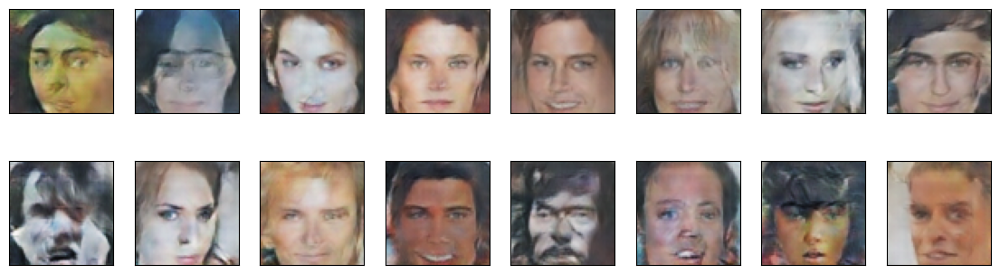

2023-11-22 17:05:35 | Epoch [30/30] | Batch 0/509 | d_loss: 0.3613 | g_loss: 7.9134
2023-11-22 17:05:37 | Epoch [30/30] | Batch 50/509 | d_loss: 0.3958 | g_loss: 9.6205
2023-11-22 17:05:39 | Epoch [30/30] | Batch 100/509 | d_loss: 0.3441 | g_loss: 7.3725
2023-11-22 17:05:40 | Epoch [30/30] | Batch 150/509 | d_loss: 0.3959 | g_loss: 12.7560
2023-11-22 17:05:42 | Epoch [30/30] | Batch 200/509 | d_loss: 0.4488 | g_loss: 2.7496
2023-11-22 17:05:44 | Epoch [30/30] | Batch 250/509 | d_loss: 0.3401 | g_loss: 10.9621
2023-11-22 17:05:45 | Epoch [30/30] | Batch 300/509 | d_loss: 0.4012 | g_loss: 6.1336
2023-11-22 17:05:47 | Epoch [30/30] | Batch 350/509 | d_loss: 0.3480 | g_loss: 10.9354
2023-11-22 17:05:49 | Epoch [30/30] | Batch 400/509 | d_loss: 0.3883 | g_loss: 7.0225
2023-11-22 17:05:50 | Epoch [30/30] | Batch 450/509 | d_loss: 0.3484 | g_loss: 9.9435
2023-11-22 17:05:52 | Epoch [30/30] | Batch 500/509 | d_loss: 2.8357 | g_loss: 0.2442


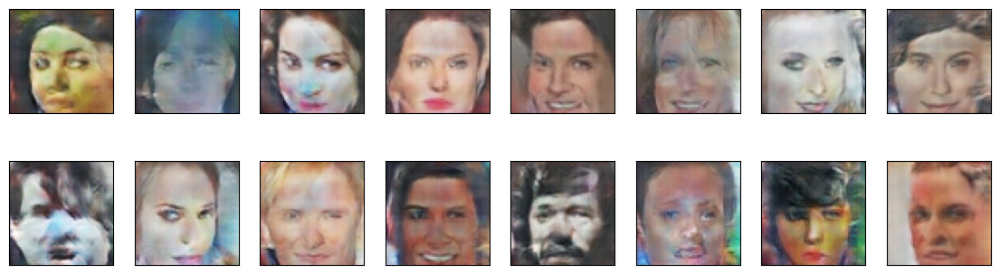

In [232]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy\
        d_loss = discriminator_step(batch_size, latent_dim, real_images, discriminator,d_optimizer)

        g_loss = generator_step(batch_size, latent_dim,generator, discriminator, g_optimizer)
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

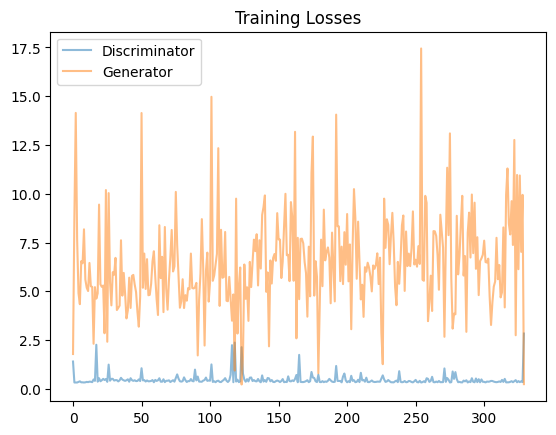

In [233]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

The generated samples have some features of the human face and generally have a wight skin color. 

I think adding more variety to the dataset will help in producing a more robust model. Moreover, I also found that complex models don't always give better results because I got the better results when I reduced the complexity of my model. 

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.

we miss you 

I miss you more, Mohandes 